# 1. PAN and catchment boundaries analysis

In [1]:
import geopandas as gpd
import pandas as pd
import os
## find the directory of the python (assures compatibility)
python_directory = os.path.abspath("")
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import folium
import copy
import math
import statistics
import numpy as np
import warnings
warnings.filterwarnings("ignore")

from models import Optimise_PANsCatchment_Schools, reset_parameters, create_custom_legend_handles, extract_PANs, Random_PANsCatchment_schools

# Data preparation

This includes adding the information required for models in the analysis phase. This includes the estimated number of 5 year olds:
- Approximately 20% of the 5 to 9 year olds in each LSOA are considered 5 year olds
- This generates a total number of 5 year 2433 student
- This estimate is acceptable as it aligns with Dennett's report in this link [https://adamdennett.github.io/BH_Secondary_Admissions_Analysis/BH_Sec_Sch_Analysis.html](https://adamdennett.github.io/BH_Secondary_Admissions_Analysis/BH_Sec_Sch_Analysis.html)

In [2]:
## load the PANs
PANs = pd.read_csv(rf"{python_directory}/data/Yr7_admissions.csv")
PANs_2024 = extract_PANs(PANs, 2024)
target_PAN = extract_PANs(PANs, 2024)
## load the maps
schools = gpd.read_file(rf"{python_directory}/data/brighton_sec_schools.geojson")
lsoa = gpd.read_file(rf"{python_directory}/data/BrightonLSOA_Clean.geojson")
students = gpd.read_file(rf"{python_directory}/data/BrightonLSOA_Clean.geojson")
catchment_a = gpd.read_file(rf"{python_directory}/data/catchment_01.geojson")
catchment_b = gpd.read_file(rf"{python_directory}/data/catchment_02.geojson")
catchment_c = gpd.read_file(rf"{python_directory}/data/catchment_03.geojson")
catchment_list = [catchment_a, catchment_b, catchment_c]
## transform lsoa and students dataframes to EPSG:27700 (For the UK)
lsoa.to_crs(epsg="27700", inplace=True)
students.to_crs(epsg="27700", inplace=True)
for catchment in catchment_list:
    catchment["geometry"] = catchment.buffer(0)
    catchment.to_crs(epsg="27700", inplace=True)

## Print the current CRS
print(f"CRS | schools = {schools.crs}, LSOA = {lsoa.crs}, students LSOA = {students.crs}")


CRS | schools = EPSG:27700, LSOA = EPSG:27700, students LSOA = EPSG:27700


## Visualise the number of estimated 5 year olds in Brighton and the school locations.

In [3]:
## define colours
colours = {
    "Blatchington Mill School": "steelblue",
    "Brighton Aldridge Community Academy": "orange",
    "Cardinal Newman Catholic School": "limegreen",
    "Dorothy Stringer School": "firebrick",
    "Hove Park School and Sixth Form Centre": "mediumpurple",
    "King's School": "sienna",
    "Longhill High School": "palevioletred",
    "Patcham High School": "gray",
    "Portslade Aldridge Community Academy": "darkkhaki",
    "Varndean School": "darkturquoise",
}

## assign school colours
schools["colour"] = [colours[schools.at[i, "establishment_name"]] for i in schools.index]

## Calculate the estimated 5 year students
reset_parameters(catchment_a, schools, students)
## Generate interactive map for the number of 5 year olds
m = students.explore(column="5_est", tooltip="5_est", name="Estimated 5 year olds", legend=True, min_zoom=12)
schools.explore(
    m=m, column="establishment_name", tooltip="establishment_name", color=schools["colour"], name="Schools", 
    marker_kwds={"radius": 5}, style_kwds={"fillOpacity":1}, legend=True
    )

display(m)
m = None

# Analysis: Optimisation model for school catchments

The analysis uses a model that assign students to schools using Euclidean distances as the driver for the assignment process. The model iterates through schools and selects the closes LSOA within the school's catchment zone. It assigns the stydebts in that LSOA to the school. This process is repeated across all schools until taking any further LSOA exceeds the respective school's allocated PAN.

In more detail, the model applies the following workflow:
- Order the schools starting from "Dorothy Stringer School" followed by the next closest school (School B), School B is then followed by its next closest (excluding "Dorothy Stinger School"), and so on.
- Each one of the 10 schools selects one LSOA and takes in all the 5 year olds within it if that does not lead to exceeding its PAN
- We repeat for as many rounds as needed until all schools have almost reached their PANs

The model generates a spatial distribution of school catchments that may not align with the catchment zones due to PAN restrictions. By comparing the results to the catchment zones, we can identify:
 - geospatial areas where the catchment zones may force students to enlist in schools at longer distances from their LSOA;
 - number of students assigned to each school from outside its catchment area
 - median distance travelled by students inside and outside the catchment area of each school

This allows for making conclusions on the suitability of the catchment areas and PAN restrictions used in 2024.

## Catchments alternative 2: Assign LSOAs to catchment zones

We consider the catchment zone alternative b (labelled "Catchment alternative 2" in the layers of the plotted map). Each LSOA is assigned to the catchment zone which contains the majority of the LSOA; it finds the best fit for assigning LSOAs to catchments. This leads to cases where the LSOA catchment zones do not strictly align with the drawn catchment zones (as the drawn catchment zones do not strictly follow the outlines of LSOAs).

In [4]:
## reset the parameters based on the second catchment alternative
reset_parameters(catchment_b, schools, students)
target_PAN["King's School"] = 0
target_PAN["Cardinal Newman Catholic School"] = 0

print("Attributes created and reset in all DataFrames")
print("--------------------")
print("LAOAs visualised based on catchment area ID")

m = students.explore(column="catchment_ID", categorical=True, cmap="tab10", tooltip="catchment_ID",  legend=True, name="LSOA alternative 2", min_zoom=12)
catchment_b.explore(m=m, tooltip="catchment_ID", style_kwds={"fill": False, "color": "black"}, name="Catchment alternative 2")
schools.explore(
    m=m, column="establishment_name", tooltip="establishment_name", color=schools["colour"], name="Schools", 
    marker_kwds={"radius": 5}, style_kwds={"fillOpacity":1}, legend=False
    )
folium.LayerControl().add_to(m)
m

Attributes created and reset in all DataFrames
--------------------
LAOAs visualised based on catchment area ID


## Catchments and PANs model: 2024 PANs | ignore King's and Cardinal Newman PANs

In [5]:
## Run the model
reset_parameters(schools=schools, students=students, catchment=catchment_b)
Optimise_PANsCatchment_Schools(schools=schools, students_lsoa=students, target_PAN=target_PAN)
print("Finalised model run")

Finalised model run


### Key observations (2024 PANs run)

The students in LSOAs are generally assigned to a school within their catchment areas. Yet, we observe a few notable exceptions:
- "Dorothy Stringer"
    - This school attracts students from 1 LSOA outside of its catchment
    - This means that the PANs of "Longhill" and "Dorothy" are higher than the number of schools in their catchment area
- Areas south of "Cardinal Newman Catholic School"
    - LSOAs in this areas are assigned after the PANs of the schools are saturated which explains why we observe spatial fragmentation in the assigned schools in this area. This is expected as we ignore the PANs "Cardinal Newman" within this model.
    - The majority of those LSOAs are assigned to "Dorothy" as it is the most proximate

Overall, all the schools end up attracting more students than their PANs to make up for "Cardinal Newman" and "King's". These schools end up with high mean distances travelled (weighed to the number of students in each LSOA) for students outside of their catchment.
 

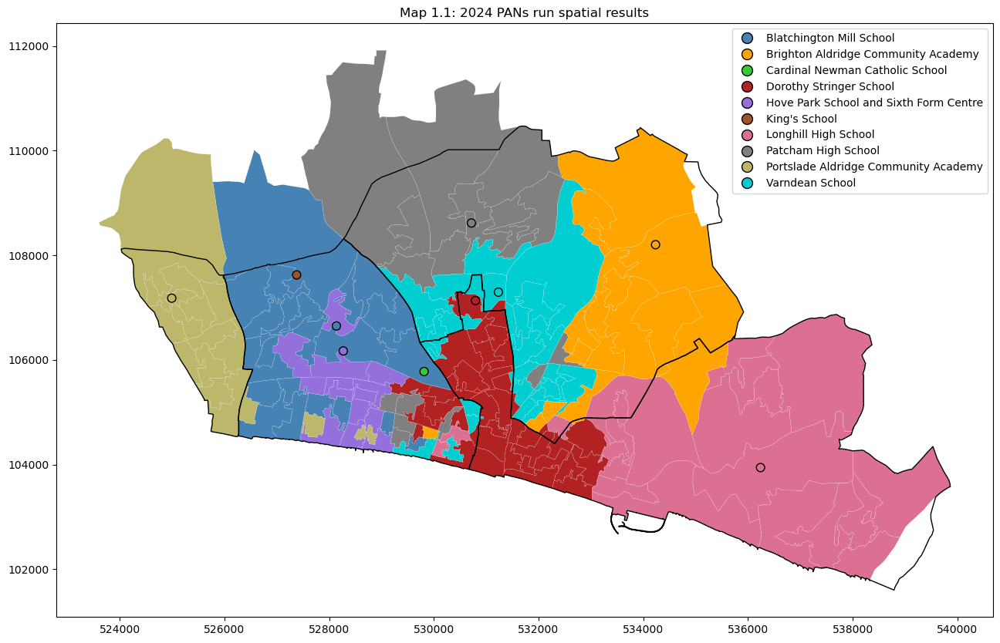

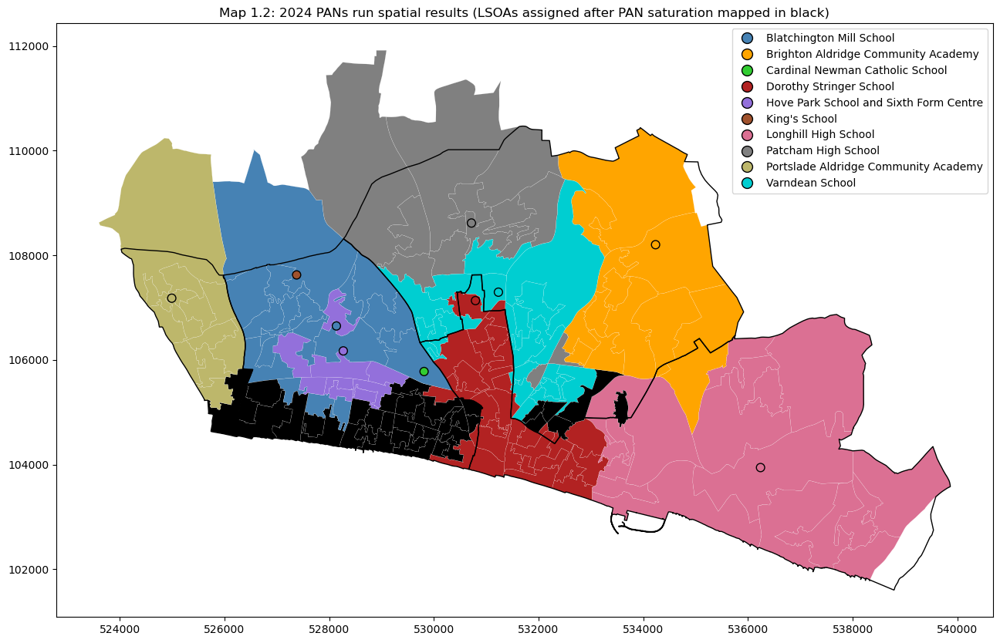

In [6]:
## Plot the map
students["colour"] = [colours[students.at[i, "school"]] for i in students.index]
students["edgecolour"] = ["white" for i in students.index]
schools["colour"] = [colours[schools.at[i, "establishment_name"]] for i in schools.index]
fig = students.plot(color=students["colour"], edgecolor=students["edgecolour"], linewidth=0.1, legend=True, figsize=(20,10))
schools.plot(ax=fig, color=schools["colour"], edgecolor='black', markersize=60, legend=True)
catchment_b.plot(ax=fig, facecolor="none", edgecolor="black", label="Catchment")
plt.title("Map 1.1: 2024 PANs run spatial results")
plt.legend(handles=create_custom_legend_handles(colours))
plt.show()
plt.close()
for i in students.index:
    if students.at[i, "external"] == True: 
        students.at[i, "colour"] = None
        students.at[i, "colour"] = "black"
fig = students.plot(color=students["colour"], edgecolor=students["edgecolour"], linewidth=0.1, legend=True, figsize=(20,10))
schools.plot(ax=fig, color=schools["colour"], edgecolor='black', markersize=60, legend=True)
catchment_b.plot(ax=fig, facecolor="none", edgecolor="black", label="Catchment")
plt.title("Map 1.2: 2024 PANs run spatial results (LSOAs assigned after PAN saturation mapped in black)")
plt.legend(handles=create_custom_legend_handles(colours))
plt.show()
plt.close()

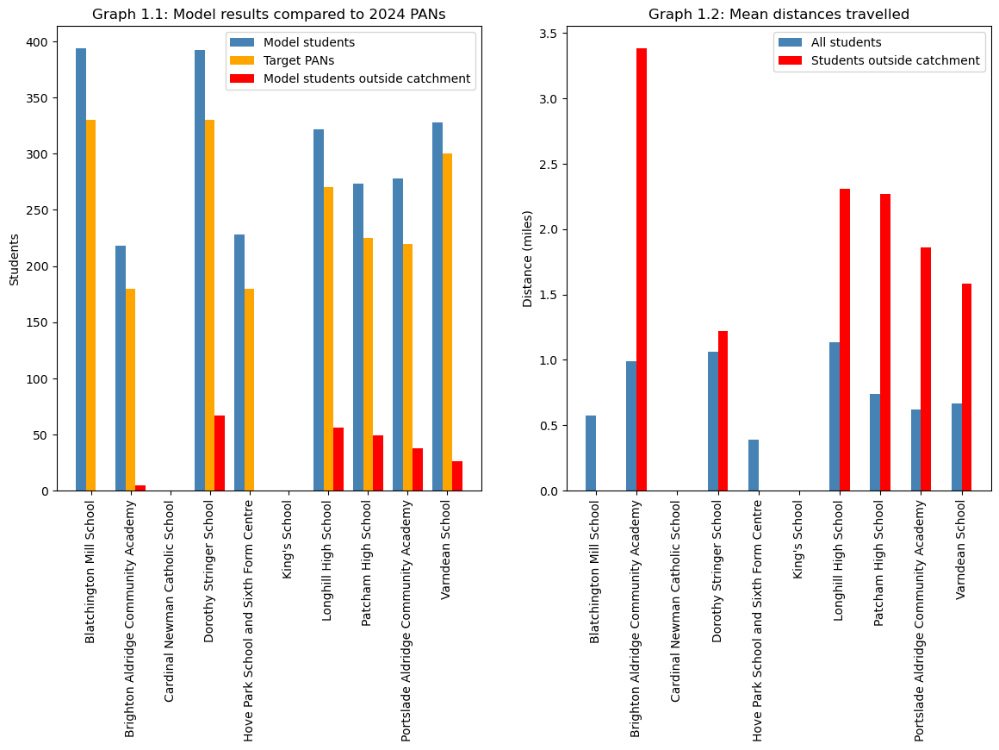

In [7]:
## plot target PAN numbers
## create ordered lists
students_total_plot, PANs_plot, students_outside_catchment, distances, distances_outside_catchment = list(), list(), list(), list(), list()
x_axis_list = list()
for school_str in PANs["school"]:
    students_total_plot.append(int(schools[schools["establishment_name"] == school_str]["students_total"]))
    PANs_plot.append(target_PAN[school_str])
    ## find all LSOAs outside the catchment
    LSOAs_outside_catchment = students[(students["school"] == school_str) & (students["catchment_ID"] != students["catchment_ID_school"])]
    students_outside_catchment.append(sum( LSOAs_outside_catchment["5_est"] ) )
    if target_PAN[school_str] == 0: distances.append(0)
    else: distances.append( ( sum(students[students["school"] == school_str]["distx5_est"]) / sum(students[students["school"] == school_str]["5_est"]) ) * 0.000621371)
    if len(LSOAs_outside_catchment.index) > 0:
        distances_outside_catchment.append( (sum(LSOAs_outside_catchment["distx5_est"]) / sum(LSOAs_outside_catchment["5_est"]))  *  0.000621371)
    else:
        distances_outside_catchment.append(0)
    x_axis_list.append(school_str)

## Generate the graphs
x_axis = np.arange(len(x_axis_list))
width = 0.25
fig = plt.figure(figsize=(14, 7))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.set_title("Graph 1.1: Model results compared to 2024 PANs")
ax1.bar(x_axis - width, students_total_plot, width, color="steelblue", label="Model students")
ax1.bar(x_axis , PANs_plot, width, color="orange", label="Target PANs")
ax1.bar(x_axis + width, students_outside_catchment, width, color="red", label="Model students outside catchment")
ax1.set_xticks(x_axis, x_axis_list, rotation=90)
ax1.set_ylabel("Students")
ax1.legend()

ax2.set_title("Graph 1.2: Mean distances travelled")
ax2.bar(x_axis - width / 2 , distances, width, color="steelblue", label="All students")
ax2.bar(x_axis + width / 2 , distances_outside_catchment, width, color="red", label="Students outside catchment")
ax2.set_xticks(x_axis, x_axis_list, rotation=90)
ax2.set_ylabel("Distance (miles)")
ax2.legend()
plt.show()
plt.close()

## Modify PANs: Reduce "Longhill" PAN from 270 to 165

In this application, we modify the PANs as follows:

In [8]:
target_PAN = {
    "Blatchington Mill School": 330,
    "Brighton Aldridge Community Academy": 165,
    "Cardinal Newman Catholic School": 360,
    "Dorothy Stringer School": 330,
    "Hove Park School and Sixth Form Centre": 180,
    "King's School": 165,
    "Longhill High School": 165,
    "Patcham High School": 225,
    "Portslade Aldridge Community Academy": 220,
    "Varndean School": 300,
}

df_dict = {
    "School": target_PAN.keys(),
    "2024": PANs_2024.values(),
    "Modified": target_PAN.values()
}

display(pd.DataFrame(df_dict))

,School,2024,Modified
0,Blatchington Mill School,330,330
1,Brighton Aldridge Community Academy,180,165
2,Cardinal Newman Catholic School,360,360
3,Dorothy Stringer School,330,330
4,Hove Park School and Sixth Form Centre,180,180
5,King's School,165,165
6,Longhill High School,270,165
7,Patcham High School,225,225
8,Portslade Aldridge Community Academy,220,220
9,Varndean School,300,300


In [9]:
## reset the parameters based on the second catchment alternative
reset_parameters(catchment_b, schools, students)
target_PAN["King's School"] = 0
target_PAN["Cardinal Newman Catholic School"] = 0

print("Attributes created and reset in all DataFrames")
print("--------------------")
## Run the model
reset_parameters(schools=schools, students=students, catchment=catchment_b)
Optimise_PANsCatchment_Schools(schools=schools, students_lsoa=students, target_PAN=target_PAN)
print("Finalised model run")


Attributes created and reset in all DataFrames
--------------------
Finalised model run


### Key observations (Modified PANs run)

The students in LSOAs are generally assigned to a school within their catchment areas. In comparison to the 2024 PANs run:
- "Dorothy Stringer"
    - This school does not attract students outside of its catchment.
    - This means that the PANs of "Longhill" and "Dorothy" are suitable for the number of schools in their catchment area. In fact, they are lower as we can observe LSOAs that have been assigned after the PAN saturation within their catchment.
- "Longhill"
    - The lower PANs for "Longhill" leaves LSOAs in its catchment area the east that has to be asigned after the PANs saturation
    - These eastern LSOAs end up assigned to "Longhill" as it is the closest school.

Similar to the 2024 PANs run, all the schools end up attracting more students than their PANs to make up for "Cardinal Newman" and "King's". These schools end up with high mean distances travelled (weighed to the number of students in each LSOA) for students outside of their catchment.
 

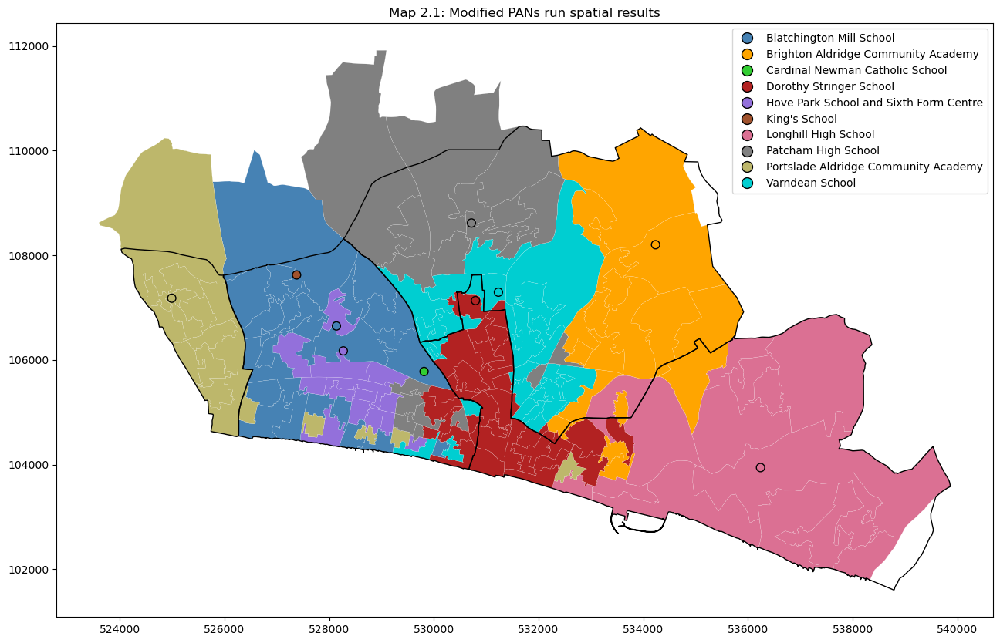

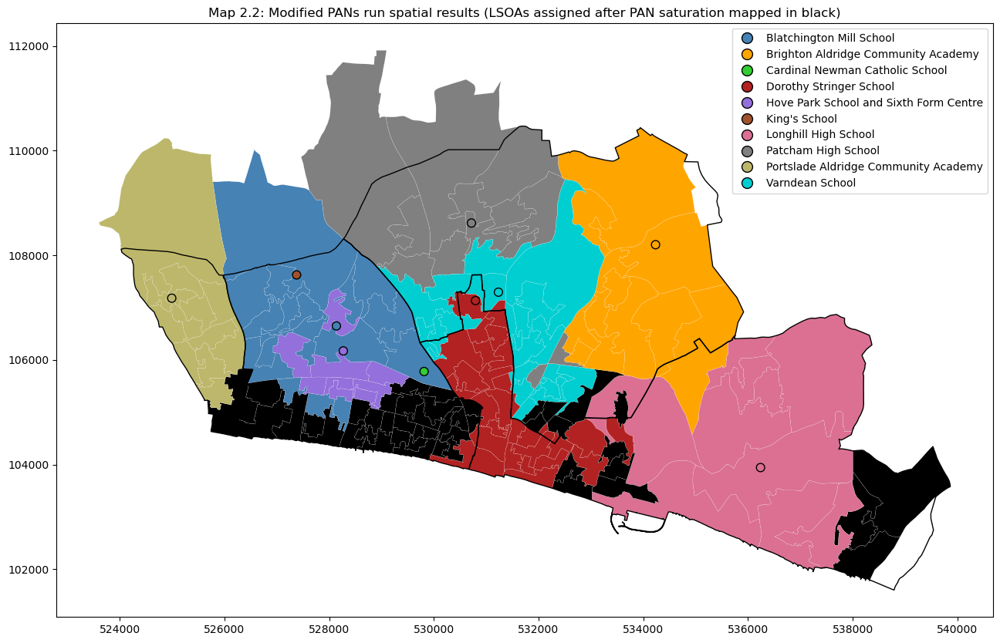

In [10]:
## Plot the map
students["colour"] = [colours[students.at[i, "school"]] for i in students.index]
students["edgecolour"] = ["white" for i in students.index]
schools["colour"] = [colours[schools.at[i, "establishment_name"]] for i in schools.index]
fig = students.plot(color=students["colour"], edgecolor=students["edgecolour"], linewidth=0.1, legend=True, figsize=(20,10))
schools.plot(ax=fig, color=schools["colour"], edgecolor='black', markersize=60, legend=True)
catchment_b.plot(ax=fig, facecolor="none", edgecolor="black", label="Catchment")
plt.title("Map 2.1: Modified PANs run spatial results")
plt.legend(handles=create_custom_legend_handles(colours))
plt.show()
plt.close()
for i in students.index:
    if students.at[i, "external"] == True: 
        students.at[i, "colour"] = None
        students.at[i, "colour"] = "black"
fig = students.plot(color=students["colour"], edgecolor=students["edgecolour"], linewidth=0.1, legend=True, figsize=(20,10))
schools.plot(ax=fig, color=schools["colour"], edgecolor='black', markersize=60, legend=True)
catchment_b.plot(ax=fig, facecolor="none", edgecolor="black", label="Catchment")
plt.title("Map 2.2: Modified PANs run spatial results (LSOAs assigned after PAN saturation mapped in black)")
plt.legend(handles=create_custom_legend_handles(colours))
plt.show()
plt.close()

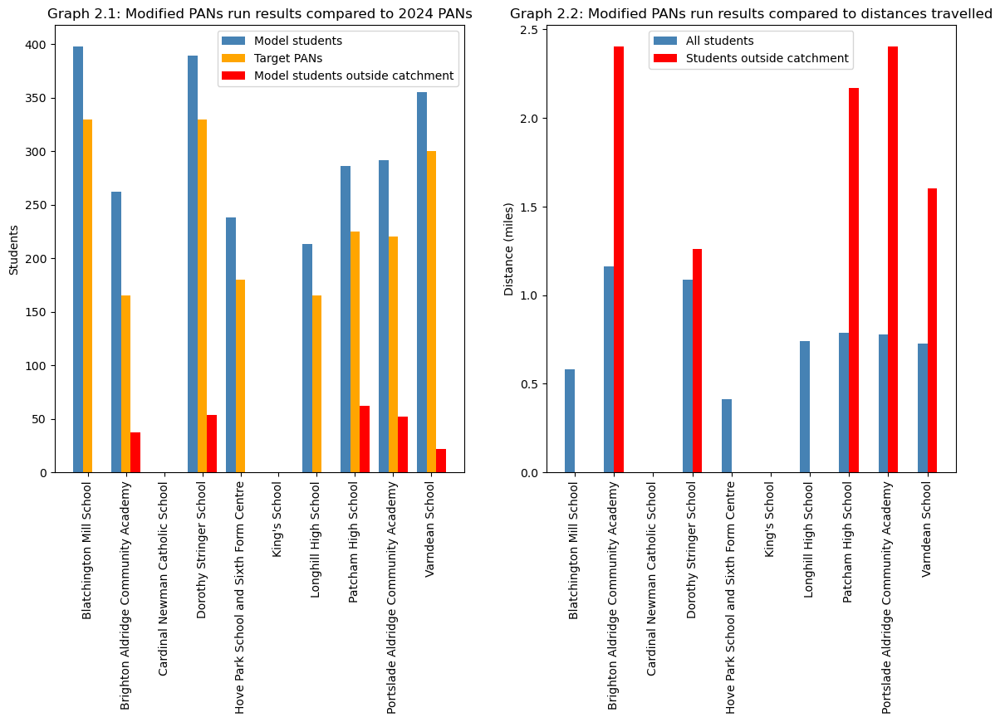

In [11]:
## plot target PAN numbers
## create ordered lists
students_total_plot, PANs_plot, students_outside_catchment, distances, distances_outside_catchment = list(), list(), list(), list(), list()
x_axis_list = list()
for school_str in PANs["school"]:
    students_total_plot.append(int(schools[schools["establishment_name"] == school_str]["students_total"]))
    PANs_plot.append(target_PAN[school_str])
    ## find all LSOAs outside the catchment
    LSOAs_outside_catchment = students[(students["school"] == school_str) & (students["catchment_ID"] != students["catchment_ID_school"])]
    students_outside_catchment.append(sum( LSOAs_outside_catchment["5_est"] ) )
    if target_PAN[school_str] == 0: distances.append(0)
    else: distances.append( ( sum(students[students["school"] == school_str]["distx5_est"]) / sum(students[students["school"] == school_str]["5_est"]) ) * 0.000621371)
    if len(LSOAs_outside_catchment.index) > 0:
        distances_outside_catchment.append( (sum(LSOAs_outside_catchment["distx5_est"]) / sum(LSOAs_outside_catchment["5_est"]))  *  0.000621371)
    else:
        distances_outside_catchment.append(0)
    x_axis_list.append(school_str)

## Generate the graphs
x_axis = np.arange(len(x_axis_list))
width = 0.25
fig = plt.figure(figsize=(14,7))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.set_title("Graph 2.1: Modified PANs run results compared to 2024 PANs")
ax1.bar(x_axis - width, students_total_plot, width, color="steelblue", label="Model students")
ax1.bar(x_axis , PANs_plot, width, color="orange", label="Target PANs")
ax1.bar(x_axis + width, students_outside_catchment, width, color="red", label="Model students outside catchment")
ax1.set_xticks(x_axis, x_axis_list, rotation=90)
ax1.set_ylabel("Students")
ax1.legend()

ax2.set_title("Graph 2.2: Modified PANs run results compared to distances travelled")
ax2.bar(x_axis - width / 2 , distances, width, color="steelblue", label="All students")
ax2.bar(x_axis + width / 2 , distances_outside_catchment, width, color="red", label="Students outside catchment")
ax2.set_xticks(x_axis, x_axis_list, rotation=90)
ax2.set_ylabel("Distance (miles)")
ax2.legend()
plt.show()
plt.close()

# 2. Distance travelled analysis

To showcase the mean distance travelled to each school, we assign the schools randomly to each school given its target PANs. We then calculate the mean distance travelled to each school from its LSOAs (weighed to the number of students in each LSOA).

## 2024 PANs distances travelled

We run the model for 20 time to account for the stochasticity in the selection of LSOAs. Foe each run, we show a sample map for the random distribution of LSOAs and the results for the mean weighed distances travelled (miles) in each run per school.

## Key observations

- The schools with the highest mean distances are "Dorothy" and "Longhill"
- "Longhill" has the highest number of students that travel more than 3 miles to school, with an average of approximately 90 students across the runs
- "Dorothy" has the second highest number of students travelling more than 3 miles, with an average of approximately 67 students

In [12]:
target_PAN = copy.deepcopy(PANs_2024)
## reset the parameters based on the second catchment alternative
reset_parameters(catchment_b, schools, students)

print("Attributes created and reset in all DataFrames")
print("--------------------")
## Run the model
print("Running the model")
reset_parameters(schools=schools, students=students, catchment=catchment_b)
dist_dict, dist_external_dict, students_3_miles_dict = Random_PANsCatchment_schools(schools=schools, students_lsoa=students, target_PAN=target_PAN, n_runs=20)
print("--------------------")

Attributes created and reset in all DataFrames
--------------------
Running the model


100%|██████████| 20/20 [00:47<00:00,  2.40s/it]

--------------------


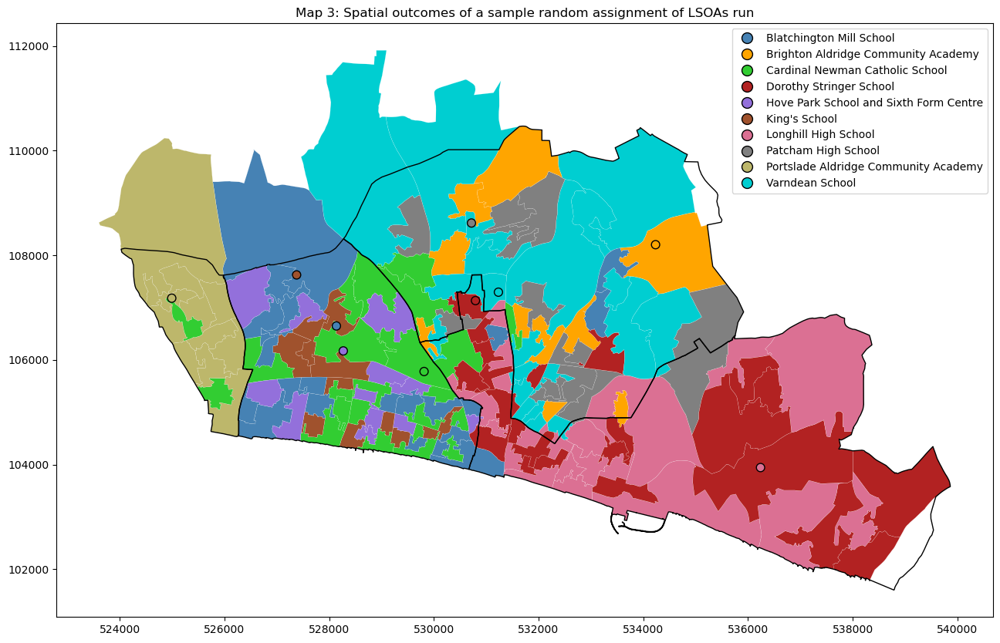

In [13]:
## Plot the map
students["colour"] = [colours[students.at[i, "school"]] for i in students.index]
students["edgecolour"] = ["white" for i in students.index]
schools["colour"] = [colours[schools.at[i, "establishment_name"]] for i in schools.index]
fig = students.plot(color=students["colour"], edgecolor=students["edgecolour"], linewidth=0.1, legend=True, figsize=(20,10))
schools.plot(ax=fig, color=schools["colour"], edgecolor='black', markersize=60, legend=True)
catchment_b.plot(ax=fig, facecolor="none", edgecolor="black", label="Catchment")
plt.title("Map 3: Spatial outcomes of a sample random assignment of LSOAs run")
plt.legend(handles=create_custom_legend_handles(colours))
plt.show()
plt.close()

In [14]:
## Show the results per run
print("Result weighed mean distances travelled by students per run (miles)")
dist_df = pd.DataFrame(dist_dict)
dist_external_df = pd.DataFrame(dist_external_dict)
students_3_miles_df = pd.DataFrame(students_3_miles_dict)
display(dist_df)
print("Number of students travelling more than 3 miles per run")
display(students_3_miles_df)

Result weighed mean distances travelled by students per run (miles)


,Blatchington Mill School,Brighton Aldridge Community Academy,Cardinal Newman Catholic School,Dorothy Stringer School,Hove Park School and Sixth Form Centre,King's School,Longhill High School,Patcham High School,Portslade Aldridge Community Academy,Varndean School
0,0.945071,1.619689,1.264535,2.086664,0.802953,1.404452,2.140684,1.378243,0.393287,0.984105
1,0.951674,1.569262,1.372755,2.212073,0.734563,1.217681,1.980210,1.278152,0.485377,1.003108
2,1.087663,1.592890,1.209733,2.046033,0.688456,1.330507,1.964596,1.114967,0.453977,0.988712
3,1.205338,1.363903,1.156162,1.933373,0.633433,1.219916,1.883122,1.588747,0.484384,0.916836
4,1.126021,1.454235,1.140443,1.927938,0.710054,1.188888,1.755258,1.511434,0.402350,0.862883
5,1.028349,1.402028,1.316441,1.778746,0.703216,1.626897,2.032421,1.130299,0.455929,0.871842
6,1.493539,1.595288,1.360936,2.229045,0.502239,1.167431,2.329135,1.123246,0.436513,1.113122
7,1.073945,1.795225,1.209068,1.770081,0.673046,0.810244,1.804625,1.290120,0.464565,0.856326
8,1.257761,1.460972,1.035143,2.329704,0.737671,0.880895,2.235482,1.460106,0.433704,0.781637
9,0.871738,1.317792,1.198974,1.901771,0.824457,0.908532,2.091724,1.206384,0.422695,1.057704


Number of students travelling more than 3 miles per run


,Blatchington Mill School,Brighton Aldridge Community Academy,Cardinal Newman Catholic School,Dorothy Stringer School,Hove Park School and Sixth Form Centre,King's School,Longhill High School,Patcham High School,Portslade Aldridge Community Academy,Varndean School
0,16,0,0,74,0,0,82,0,0,0
1,9,0,16,59,0,0,88,0,0,0
2,23,0,0,56,0,0,74,0,0,0
3,15,0,0,57,0,0,101,0,0,0
4,15,0,0,83,0,0,64,0,0,0
5,37,0,16,42,0,0,79,0,0,0
6,50,0,0,87,0,0,114,0,0,0
7,0,0,0,43,0,0,68,0,0,0
8,46,0,0,105,0,0,84,0,0,0
9,18,0,0,57,0,0,87,0,0,0


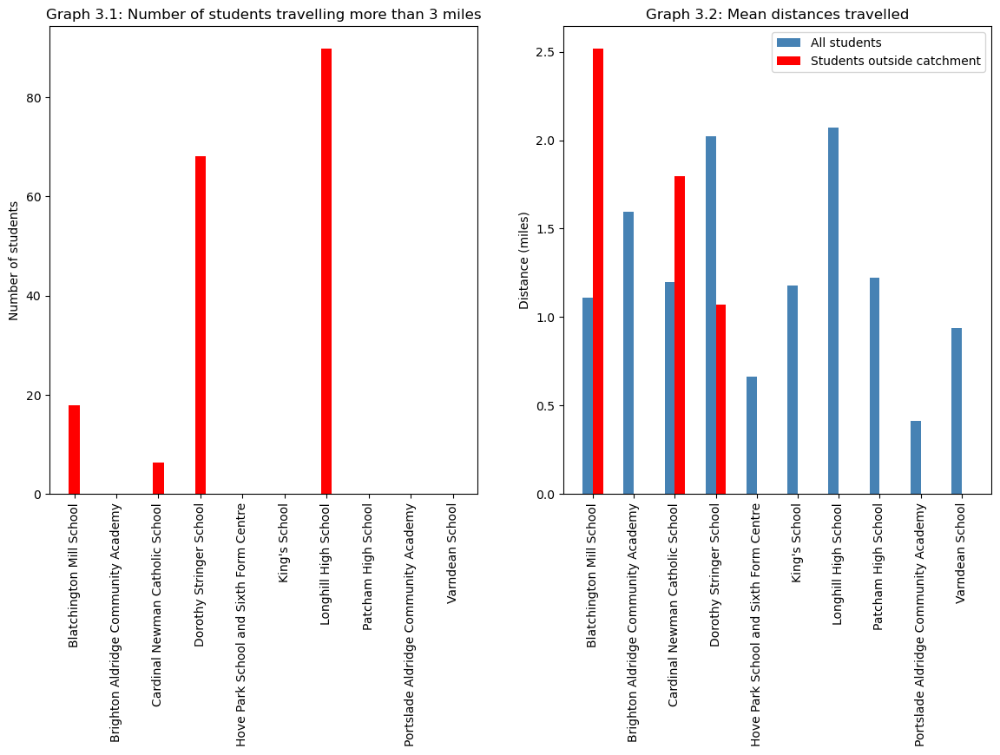

In [15]:
## plot target PAN numbers
## create ordered lists
distances, distances_outside_catchment, students_3_miles = list(), list(), list()
x_axis_list = list()
for school_str in dist_df.columns:
    ## find all LSOAs outside the catchment
    LSOAs_outside_catchment = students[(students["school"] == school_str) & (students["catchment_ID"] != students["catchment_ID_school"])]
    if target_PAN[school_str] == 0: distances.append(0)
    else: distances.append(statistics.mean(dist_df[school_str]))
    if len(LSOAs_outside_catchment.index) > 0:
        distances_outside_catchment.append(statistics.mean(dist_external_df[school_str]))
    else:
        distances_outside_catchment.append(0)
    students_3_miles.append(statistics.mean(students_3_miles_df[school_str]))
    x_axis_list.append(school_str)

## Generate the graphs
x_axis = np.arange(len(x_axis_list))
width = 0.25
fig = plt.figure(figsize=(14,7))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.set_title("Graph 3.1: Number of students travelling more than 3 miles")
ax1.bar(x_axis, students_3_miles, width, color="red")
ax1.set_xticks(x_axis, x_axis_list, rotation=90)
ax1.set_ylabel("Number of students")

ax2.set_title("Graph 3.2: Mean distances travelled")
ax2.bar(x_axis - width / 2 , distances, width, color="steelblue", label="All students")
ax2.bar(x_axis + width / 2 , distances_outside_catchment, width, color="red", label="Students outside catchment")
ax2.set_xticks(x_axis, x_axis_list, rotation=90)
ax2.set_ylabel("Distance (miles)")
ax2.legend()
plt.show()
plt.close()